# Temperetura RIDE

Carolina Musso [](https://orcid.org/0000-0002-8107-6458) (Universidade de Brasília)  
17 de julho de 2025

In September 2021, a significant jump in seismic activity on the island of La Palma (Canary Islands, Spain) signaled the start of a volcanic crisis that still continues at the time of writing. Earthquake data is continually collected and published by the Instituto Geográphico Nacional (IGN). …

## Introdução

A temperatura doplaneta lalala

In [ ]:
rm(list=ls())
if(!require("pacman")) install.packages("pacman")


Loading required package: pacman

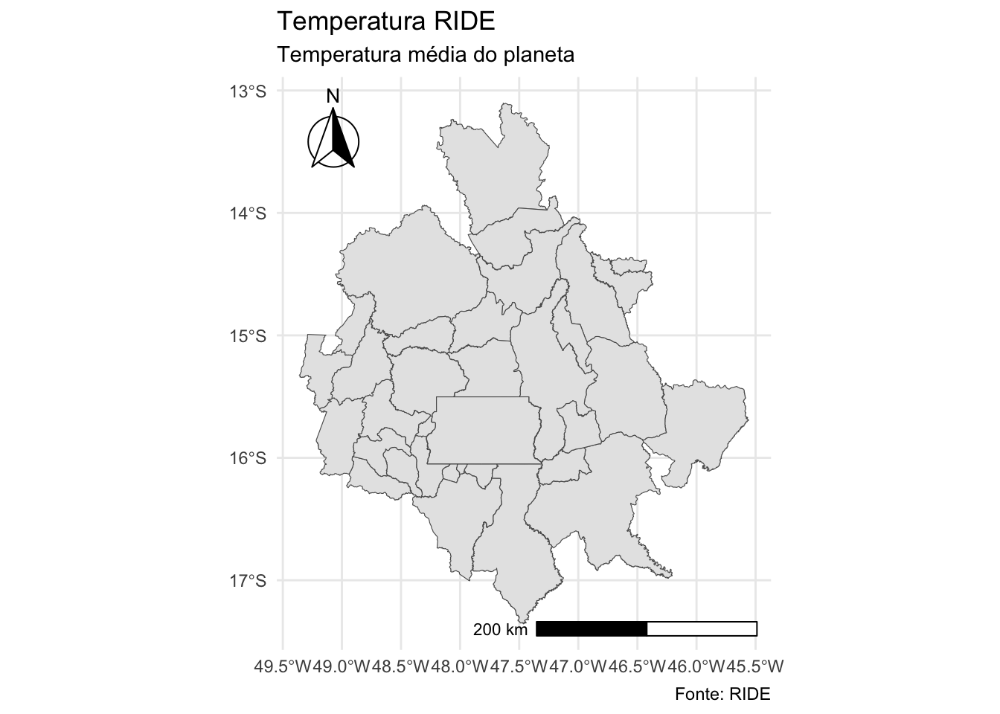

In [ ]:
## ler os shapefiles com pacote sp
ride_sf <- sf::read_sf("RIDE/.")

ride_sf |> ggplot()+
  geom_sf() +
  scale_fill_viridis_c() +
  theme_minimal() +
  labs(
    title = "Temperatura RIDE",
    subtitle = "Temperatura média do planeta",
    caption = "Fonte: RIDE"
  ) +
  theme(legend.position = "bottom") +
  annotation_scale(location = "br", width_hint = 0.5) +
  annotation_north_arrow(location = "tl", style = north_arrow_fancy_orienteering)


In [ ]:
# username <- ""
# password <- ""
# mf_login(credentials = c(username, password))
# 
# 
# roi <- st_as_sf(
#   data.frame(id = "ride_df",
#              geom =  "POLYGON ((-49.36 -17.36, -49.36 -13.10, -45.56 -13.10, -45.56 -17.36, -49.36 -17.36))"),
#   wkt = "geom", crs = 4326
# )
# 
# 
# collection <- "MOD11A1.061" #10:30
# variables <- c("LST_Day_1km")
# time_range <- as.Date(c("2020-10-22", "2020-10-22"))
# 
# urls <- mf_get_url(collection = collection, variables = variables,
#                    roi = roi, time_range = time_range)


In [ ]:
# res <-  mf_download_data(urls)
# 
# 
# rast <- mf_import_data(
#   path = unique(dirname(res$destfile))[1],
#   collection = collection,
#   proj_epsg = 4326)
# 
# df <- as.data.frame(rast, xy = TRUE)
# df$lst_c <- df$LST_Day_1km - 273.15
# 
# # 7) Exportar como CSV
# write.csv(df[, c("x","y","lst_c")], "temperatura_geral.csv", row.names = FALSE)
# 


In [ ]:
df <- read_csv("temperatura_geral.csv")


Rows: 110038 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (3): x, y, lst_c

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

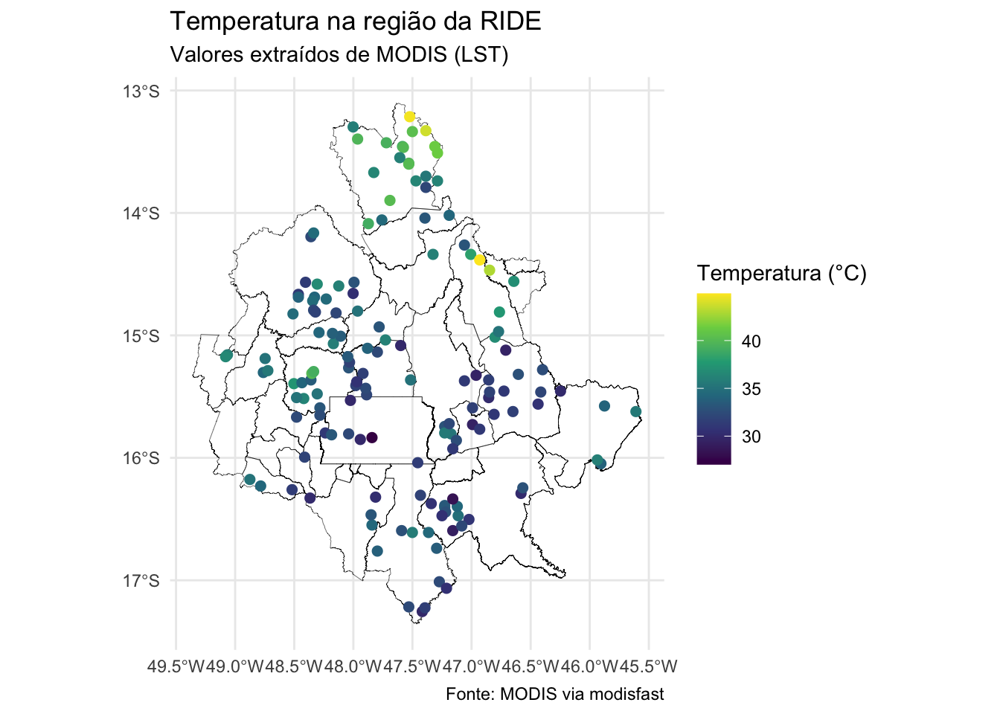

In [ ]:
ggplot() +
  geom_sf(data = ride_sf, fill = NA, color = "black", linewidth = 0.1) +  # polígono em preto
  geom_sf(data = dados_utm_sf_amostra, aes(color = temp), size = 2) +  # pontos coloridos
  scale_color_viridis_c(name = "Temperatura (°C)") +
  theme_minimal() +
  labs(
    title = "Temperatura na região da RIDE",
    subtitle = "Valores extraídos de MODIS (LST)",
    caption = "Fonte: MODIS via modisfast"
  )


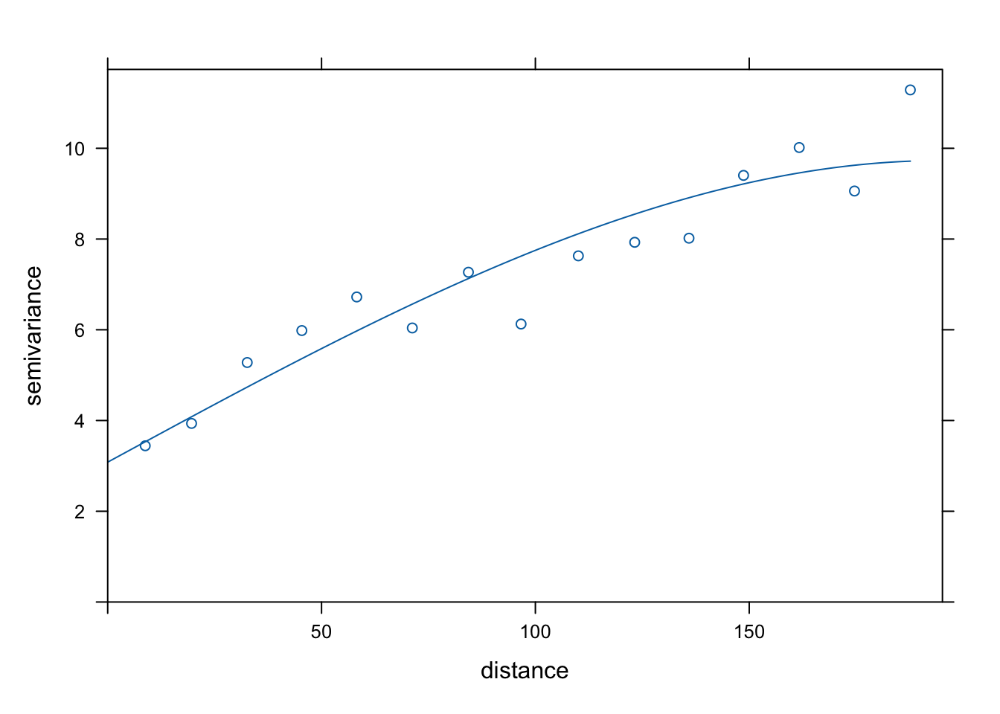

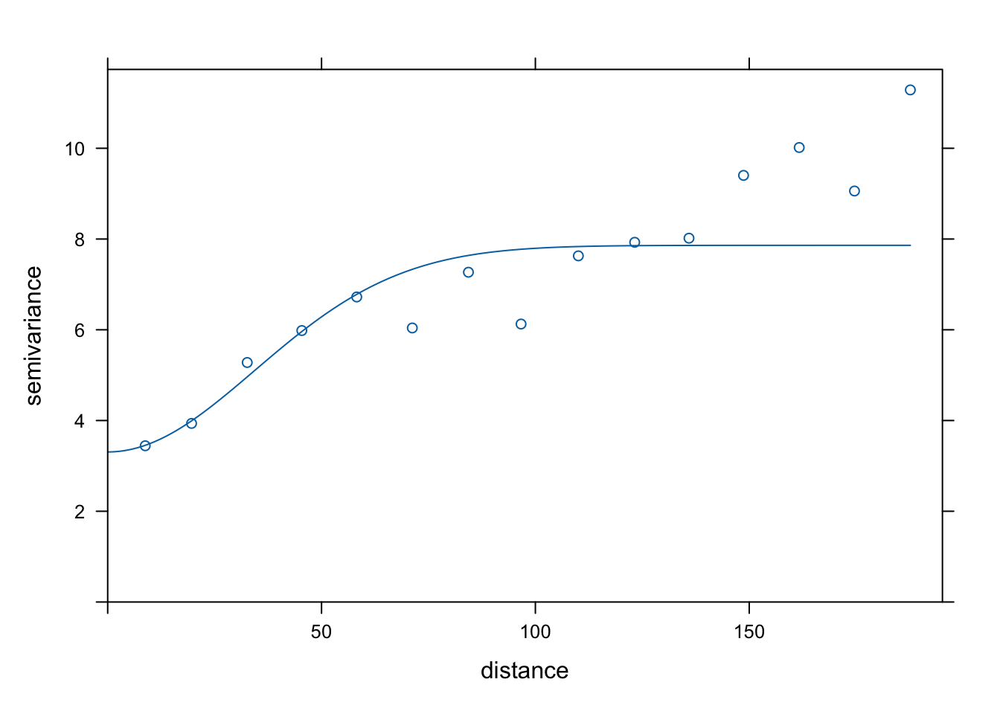

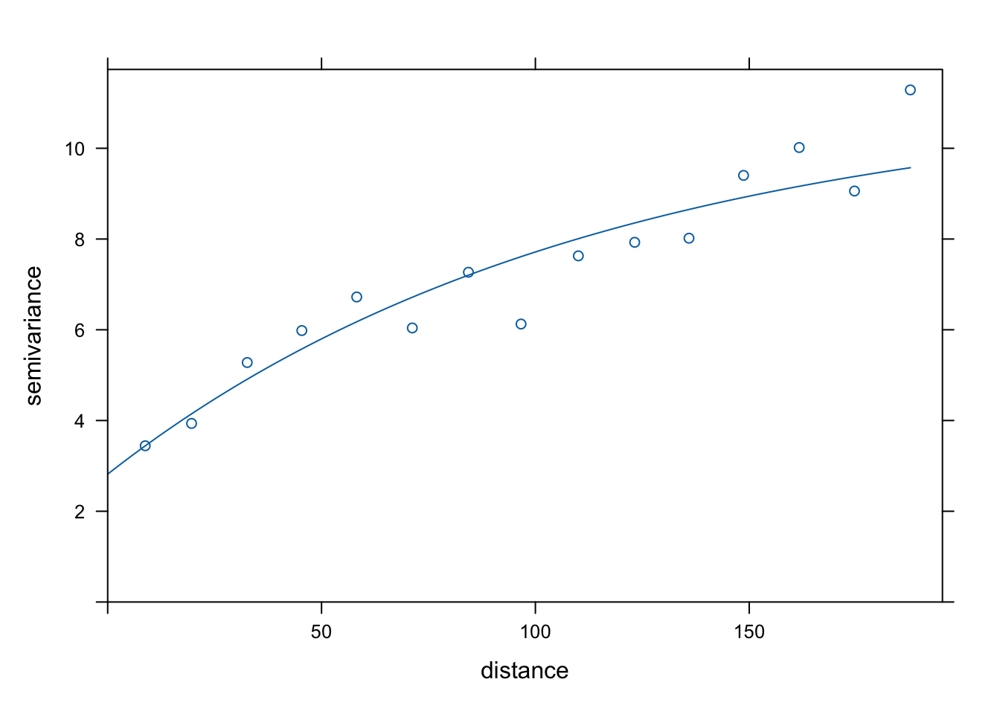

In [ ]:
v <- variogram(temp ~ 1, data = dados_utm_sf_amostra)
v$dist <- v$dist / 1000  # converte distância para km

fv <- fit.variogram(v, model = vgm(psill = 15, model = "Sph", range = 200, nugget = 3))
plot(v, fv)


[1] "temp"     "geometry"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  27.04   31.72   33.41   33.99   35.65   44.91 

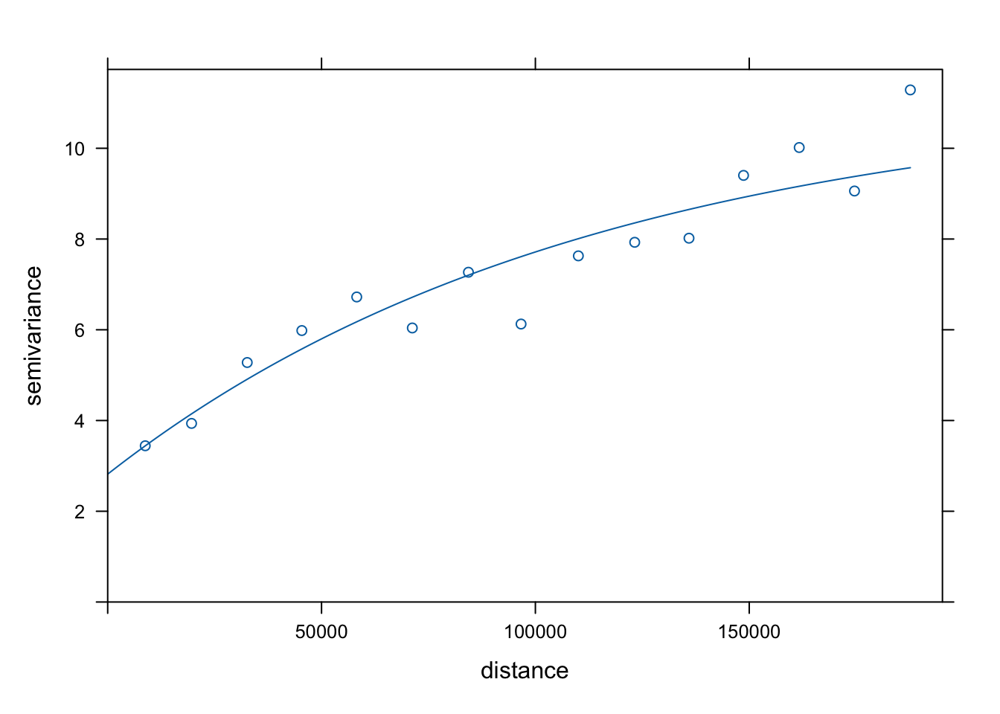

[using ordinary kriging]

Warning in st_point_on_surface.sfc(sf::st_zm(x)): st_point_on_surface may not
give correct results for longitude/latitude data

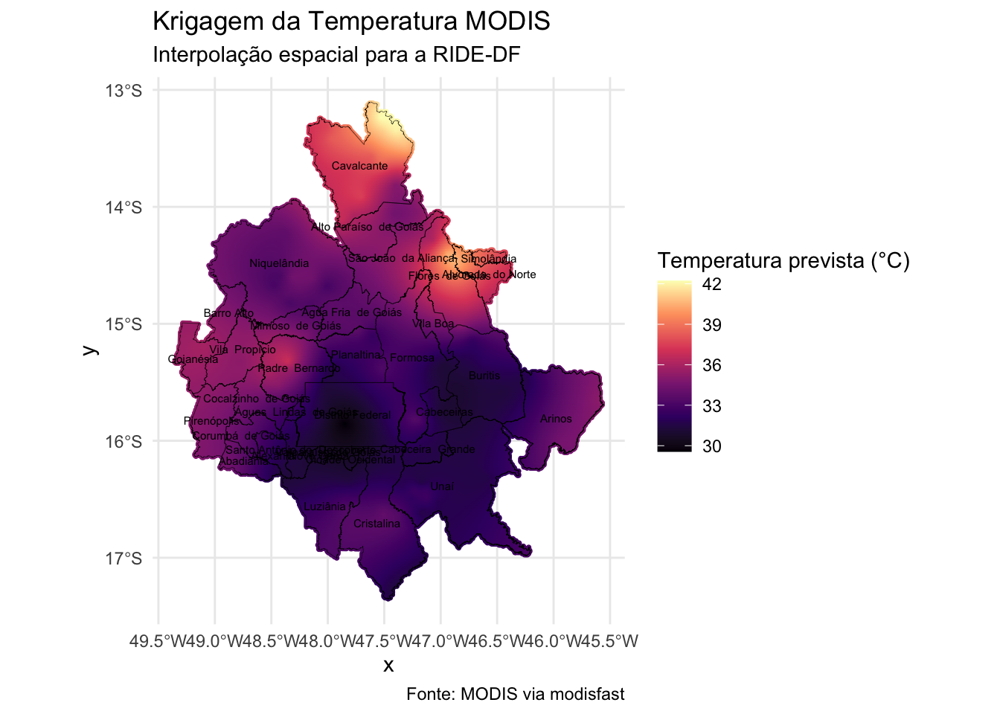

In [ ]:
# Transformar ambos para UTM zona 23S
ride_utm <- st_transform(ride_sf, 31983)


# ✅ Verificação da variável de temperatura
names(dados_utm_sf_amostra)


In [ ]:
# 📦 Pacotes
if (!require("pacman")) install.packages("pacman")
pacman::p_load(sf, gstat, stars, leaflet, viridis)

# 🌍 Reprojetar ambos para WGS84 (latitude/longitude)
ride_ll <- st_transform(ride_utm, 4326)
kpred_ll <- st_transform(st_as_sf(kpred), 4326)

# 🎨 Paleta de cores (magma)
pal <- colorNumeric(palette = "magma", domain = kpred_ll$var1.pred)

# 🗺️ Mapa interativo com limites e nomes dos municípios
leaflet() %>%
  addProviderTiles(providers$CartoDB.Positron) %>%
  addCircleMarkers(
    data = kpred_ll,
    radius = 3,
    fillColor = ~pal(var1.pred),
    fillOpacity = 0.7,
    stroke = FALSE,
    label = ~paste0("Temp: ", round(var1.pred, 1), " °C")
  ) %>%
  # Polígono com os municípios (com rótulo interativo)
  addPolygons(
    data = ride_ll,
    color = "white",
    weight = 1,
    fillOpacity = 0,
    label = ~NM_MUNICIP  # altere aqui caso o nome esteja em outra coluna
  ) %>%
  
  # Limite da RIDE destacado em preto
  addPolygons(
    data = st_union(ride_ll),  # união dos polígonos para contorno da RIDE
    color = "black",
    weight = 2,
    fill = FALSE,
    label = "Limite da RIDE"
  ) %>%
  
  # Pontos de krigagem coloridos
  
  
  # Legenda
  addLegend(
    position = "bottomright",
    pal = pal,
    values = kpred_ll$var1.pred,
    title = "Temperatura prevista (°C)",
    opacity = 1
  )


## Data & Methods

## Conclusion

## References